In [79]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.tree import export_graphviz
import pydot
from subprocess import call
from IPython.display import Image

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/usa-cers-dataset/USA_cars_datasets.csv


In [2]:
df = pd.read_csv("/kaggle/input/usa-cers-dataset/USA_cars_datasets.csv")

In [3]:
df.head()

,Unnamed: 0,price,brand,model,year,title_status,mileage,color,vin,lot,state,country,condition
0,0,6300,toyota,cruiser,2008,clean vehicle,274117.0,black,jtezu11f88k007763,159348797,new jersey,usa,10 days left
1,1,2899,ford,se,2011,clean vehicle,190552.0,silver,2fmdk3gc4bbb02217,166951262,tennessee,usa,6 days left
2,2,5350,dodge,mpv,2018,clean vehicle,39590.0,silver,3c4pdcgg5jt346413,167655728,georgia,usa,2 days left
3,3,25000,ford,door,2014,clean vehicle,64146.0,blue,1ftfw1et4efc23745,167753855,virginia,usa,22 hours left
4,4,27700,chevrolet,1500,2018,clean vehicle,6654.0,red,3gcpcrec2jg473991,167763266,florida,usa,22 hours left


In [4]:
df.keys()

Index(['Unnamed: 0', 'price', 'brand', 'model', 'year', 'title_status',
       'mileage', 'color', 'vin', 'lot', 'state', 'country', 'condition'],
      dtype='object')

In [5]:
len(df)
##this is pretty small amount of views##

2499

In [6]:
df.isnull().sum()

Unnamed: 0      0
price           0
brand           0
model           0
year            0
title_status    0
mileage         0
color           0
vin             0
lot             0
state           0
country         0
condition       0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2499 entries, 0 to 2498
Data columns (total 13 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    2499 non-null   int64  
 1   price         2499 non-null   int64  
 2   brand         2499 non-null   object 
 3   model         2499 non-null   object 
 4   year          2499 non-null   int64  
 5   title_status  2499 non-null   object 
 6   mileage       2499 non-null   float64
 7   color         2499 non-null   object 
 8   vin           2499 non-null   object 
 9   lot           2499 non-null   int64  
 10  state         2499 non-null   object 
 11  country       2499 non-null   object 
 12  condition     2499 non-null   object 
dtypes: float64(1), int64(4), object(8)
memory usage: 253.9+ KB


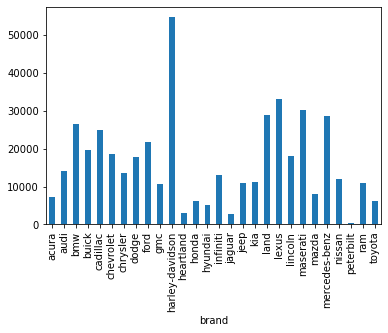

In [8]:
df_group_brand_mean_price = df.price.groupby(df.brand).mean()
df_group_brand_mean_price.plot.bar()

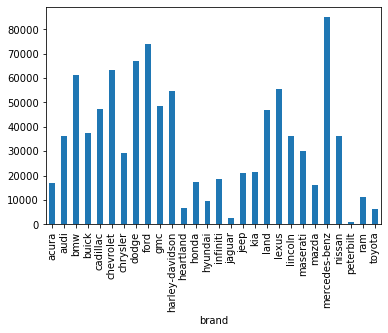

In [9]:
df_group_brand_max_price = df.price.groupby(df.brand).max()
df_group_brand_max_price.plot.bar()

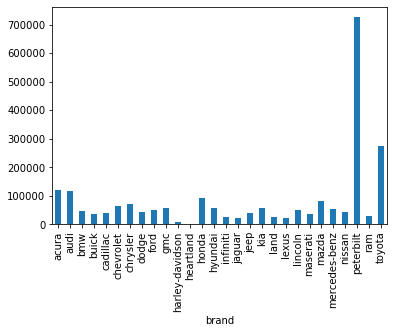

In [10]:
df_group_brand_mileage_mean = df.mileage.groupby(df.brand).mean()
df_group_brand_mileage_mean.plot.bar()
#toyota seems to be more stronger type and peterbilt too

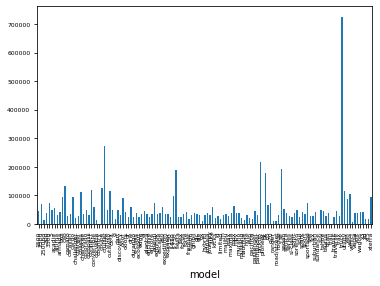

In [42]:
df_group_model_mileage_mean = df.mileage.groupby(df.model).mean()
df_group_model_mileage_mean.plot.bar()
plt.tick_params(labelsize=6)

In [12]:
df.model.value_counts()


door       651
f-150      219
doors      148
caravan    102
mpv         87
          ... 
cruiser      1
glc          1
soul         1
xterra       1
nvp          1
Name: model, Length: 127, dtype: int64

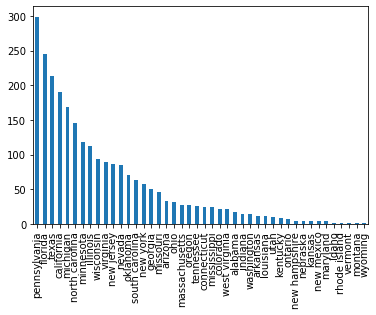

In [34]:
df.state.value_counts().plot.bar()


In [14]:
change_to_dummy_brand = pd.get_dummies(df,columns=["model"])
change_to_dummy_brand
df_remove= change_to_dummy_brand.drop(columns=["Unnamed: 0","price", "brand", 'title_status', 'color', 'vin', 'lot', 'state', 'country', 'condition'],axis=1)

In [15]:
y=change_to_dummy_brand["price"]
x =df_remove
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=42)

In [16]:
x_train.head()

,year,mileage,model_1500,model_2500,model_2500hd,model_300,model_3500,model_5,model_acadia,model_altima,...,model_van,model_vans,model_vehicl,model_versa,model_volt,model_wagon,model_x3,model_xd,model_xt5,model_xterra
2469,2018,34547.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1260,2019,14393.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2445,2015,83975.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1558,2013,140870.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
65,2017,32504.0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [17]:
regressor = LinearRegression()  
regressor.fit(x_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [18]:
#To retrieve the intercept:
print(regressor.intercept_)
#For retrieving the slope:


25025683788.512005


In [19]:
y_pred = regressor.predict(x_test)

print(y_pred.shape,y_test.shape)


(625,) (625,)


In [20]:
df_compare = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df1 = df_compare.head(50)
df1

,Actual,Predicted
2319,11390,15874.289700
1865,27900,27186.657360
902,2500,6701.320190
2240,10900,10109.371681
1285,23600,23246.465771
56,20000,20529.031185
1681,33400,27939.687260
802,8900,10526.300293
812,14500,16082.972748
903,28700,23364.602222


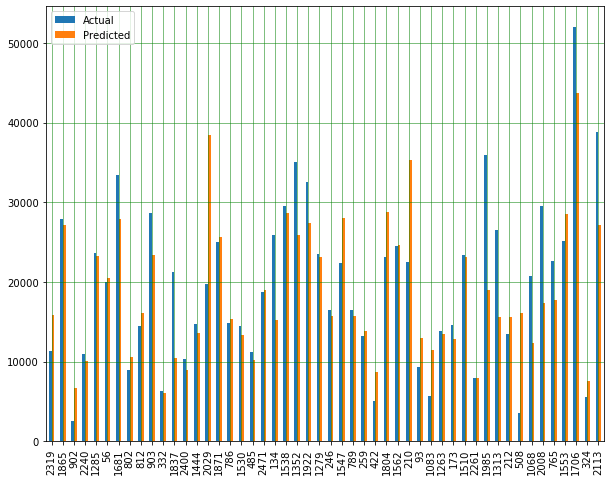

In [21]:
df1.plot(kind='bar',figsize=(10,8))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [22]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))  
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))  
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 372799738.43097025
Mean Squared Error: 9.690087170233209e+18
Root Mean Squared Error: 3112890484.779895


In [43]:
#try in ols method do linear regression
X = sm.add_constant(x_train)
model = sm.OLS(y_train,X)
results = model.fit()
results.params

const          -1.365486e+06
year            6.941821e+02
mileage        -4.388865e-02
model_1500     -5.238487e+03
model_2500     -2.366413e+03
                    ...     
model_wagon    -9.399354e+03
model_x3       -8.259741e+03
model_xd       -8.346754e-13
model_xt5       2.135181e+03
model_xterra   -2.042748e+04
Length: 130, dtype: float64

In [32]:
model_summary = results.summary()
model_summary

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.657
Model:                            OLS   Adj. R-squared:                  0.633
Method:                 Least Squares   F-statistic:                     28.20
Date:                Sat, 02 May 2020   Prob (F-statistic):               0.00
Time:                        07:43:52   Log-Likelihood:                -19248.
No. Observations:                1874   AIC:                         3.874e+04
Df Residuals:                    1754   BIC:                         3.940e+04
Df Model:                         119                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const             -1.365e+06   1.45e+05     -9.395      0.000   -1.65e+06   -1.08e+06
year                694.1821     72.658      9.554      0.000     551.677     836.687
mileage              -0.0439      0.004    -10.670      0.000      -0.052      -0.036
model_1500        -5238.4870   1851.084     -2.830      0.005   -8869.050   -1607.925
model_2500        -2366.4132   3262.165     -0.725      0.468   -8764.555    4031.728
model_2500hd      -2221.4161   7297.001     -0.304      0.761   -1.65e+04    1.21e+04
model_300         -1.508e+04   3518.956     -4.287      0.000    -2.2e+04   -8182.566
model_3500         1.495e+04   4343.043      3.442      0.001    6430.274    2.35e+04
model_5            5181.2352   7268.023      0.713      0.476   -9073.664    1.94e+04
model_acadia      -2.214e-08   3.48e-08     -0.637      0.524   -9.04e-08    4.61e-08
model_altima      -2.094e+04   2357.366     -8.882      0.000   -2.56e+04   -1.63e+04
model_armada      -8132.2246   3865.305     -2.104      0.036   -1.57e+04    -551.135
model_bus         -1.771e+04   5199.541     -3.405      0.001   -2.79e+04   -7509.063
model_cab         -8732.8257   3796.501     -2.300      0.022   -1.62e+04   -1286.683
model_camaro       -887.6978   3299.775     -0.269      0.788   -7359.605    5584.209
model_caravan     -1.817e+04   1675.051    -10.848      0.000   -2.15e+04   -1.49e+04
model_cargo       -1.849e+04   5240.547     -3.528      0.000   -2.88e+04   -8212.568
model_challenger  -8835.4394   1859.775     -4.751      0.000   -1.25e+04   -5187.831
model_charger     -1.115e+04   1881.310     -5.925      0.000   -1.48e+04   -7457.179
model_chassis     -1.871e+04   7195.825     -2.601      0.009   -3.28e+04   -4599.758
model_cherokee    -1.386e+04   5275.615     -2.626      0.009   -2.42e+04   -3508.073
model_colorado    -1.325e+04   2636.884     -5.026      0.000   -1.84e+04   -8082.461
model_compass     -1.769e+04   3873.958     -4.568      0.000   -2.53e+04   -1.01e+04
model_connect      1.838e-08   2.46e-08      0.748      0.455   -2.98e-08    6.66e-08
model_convertible -9379.2958   7184.000     -1.306      0.192   -2.35e+04    4710.809
model_corvette     1.885e+04   3787.965      4.976      0.000    1.14e+04    2.63e+04
model_country      -2.76e+04   7214.731     -3.825      0.000   -4.18e+04   -1.34e+04
model_coupe       -1.893e+04   3663.788     -5.168      0.000   -2.61e+04   -1.17e+04
model_cruiser      -1.01e+04   7296.362     -1.384      0.166   -2.44e+04    4209.502
model_cruze       -2.488e+04   5203.606     -4.781      0.000   -3.51e+04   -1.47e+04
model_cutaway     -1.438e+04   2591.883     -5.549      0.000   -1.95e+04   -9297.972
model_cx-3        -1.589e+04   7279.902     -2.183      0.029   -3.02e+04   -1611.048
model_d            -2.41e+04   5243.076     -4.597      0.000   -3.44e+04

In [65]:
#try anthoer method to hope to improvement - Randomforest regressor
randomforestregressormodel = RandomForestRegressor(n_estimators = 1000, random_state = 42)
randomforestregressormodel.fit(x_train,y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=1000, n_jobs=None, oob_score=False,
                      random_state=42, verbose=0, warm_start=False)

In [66]:
y_predict_forest = randomforestregressormodel.predict(x_test)
y_predict_forest

array([2.02153180e+04, 2.78950740e+04, 2.64326400e+03, 9.04450000e+03,
       2.44437220e+04, 1.79533000e+04, 3.44909000e+04, 8.32674400e+03,
       1.71447200e+04, 2.25875990e+04, 6.57296100e+03, 9.57454400e+03,
       1.04987500e+04, 1.78369020e+04, 2.83021060e+04, 2.55549330e+04,
       1.58204980e+04, 2.30046610e+04, 1.03168590e+04, 1.74936000e+04,
       1.63325490e+04, 2.67662000e+04, 3.12408333e+04, 2.55500000e+04,
       2.37431110e+04, 1.77759670e+04, 2.82057000e+04, 1.59868820e+04,
       7.60301900e+03, 4.59893000e+03, 2.40974160e+04, 2.59974480e+04,
       2.37354600e+04, 1.86404100e+04, 1.10324250e+04, 1.13915140e+04,
       1.02133790e+04, 2.22990290e+04, 1.01644400e+04, 2.73269480e+04,
       2.11368960e+04, 2.35634630e+04, 2.73707300e+04, 1.36284660e+04,
       2.93379700e+04, 2.29264010e+04, 2.74165200e+04, 4.32527000e+04,
       9.18810000e+03, 3.50018000e+04, 3.90455000e+04, 6.57550000e+01,
       2.53907540e+04, 3.06859800e+04, 7.06527000e+03, 3.89156500e+03,
      

In [67]:
mse = mean_squared_error(y_test,y_predict_forest)
rmse = np.sqrt(mse)
rmse

7787.161233814734

In [68]:
randomforestregressormodel.decision_path(x_test)

(<625x2250646 sparse matrix of type '<class 'numpy.longlong'>'
 	with 17522524 stored elements in Compressed Sparse Row format>,
 array([      0,    2245,    4538, ..., 2246144, 2248347, 2250646]))

In [82]:
tree = randomforestregressormodel.estimators_[5]
export_graphviz(tree, out_file = 'tree.dot', feature_names = df_remove.keys(), rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png')


In [80]:
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])


0

In [81]:
Image(filename = 'tree.png')
